In [3]:
%load_ext autoreload
%autoreload 2

import os
import sys
from pathlib import Path
from collections import defaultdict
from drone_footage import DroneFlightPass, FlightDifference, PROJECT_ROOT

sys.path.append(PROJECT_ROOT)

MASTER_REF = PROJECT_ROOT / "data/2025-10-18/drone_imaging/2025-10-18T1000PST_ORTHO_NDRE.tif"
DATA_DIR = PROJECT_ROOT / "data/2025-10-18/drone_imaging/"

TEMPERATURE_TIMESTAMPS = [
    "2025-10-18T0930PST",
    "2025-10-18T1130PST",
    "2025-10-18T1200PST",
]
NUM_BANDS = 15

In [4]:
ndre_flight_pass = DroneFlightPass(
    timestamp = "2025-10-18T1000PST", 
    master_reference_path = MASTER_REF,
    data_dir=DATA_DIR    
)
ndre_flight_pass.nodata_mask = ndre_flight_pass.create_mask_from_feature("NDRE", -1, greater_than=False)

temperature_flight_passes : list[DroneFlightPass] = []
for ts in TEMPERATURE_TIMESTAMPS:
    flight_pass = DroneFlightPass(
        timestamp = ts, 
        master_reference_path = MASTER_REF,
        data_dir=DATA_DIR,
        verbose=False  
    )
    flight_pass.nodata_mask = flight_pass.create_mask_from_feature("TIR_Celsius", -1, greater_than=False)
    temperature_flight_passes.append(flight_pass)

Loaded drone flight pass for 2025-10-18T1000PST
Available channels (7):
   0: MS_band0
   1: MS_band1
   2: MS_band2
   3: MS_band3
   4: MS_band4
   5: MS_band5
   6: NDRE
Data shape: (7, 6096, 6207) (channels, height, width)


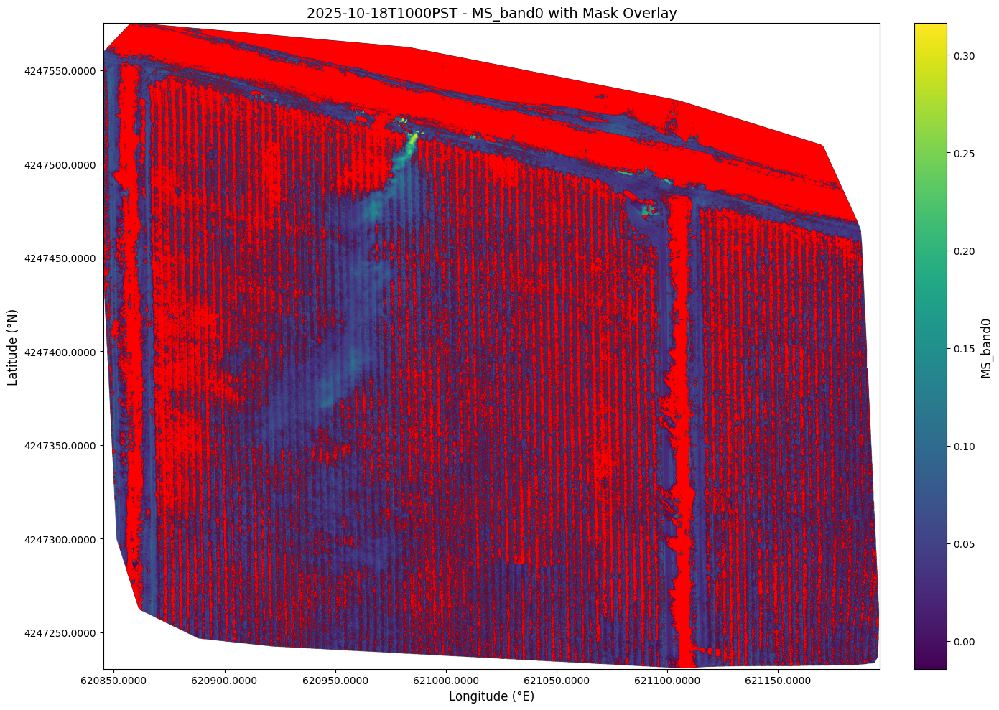

In [5]:
vegetation_mask = ndre_flight_pass.create_mask_from_feature("NDRE", 0.05, greater_than=True)
# Unfortunately, we cannot create a NDRE based vegetation mask because the plume blocks vegetation
_ = ndre_flight_pass.visualize_mask(vegetation_mask, "MS_band0", mask_alpha=1.0)

In [6]:
experimental_region_coords = [
    (620872, 4247289), 
    (621085, 4247289), 
    (621085, 4247475), 
    (620872, 4247540)
]
experimental_region_strip_bands = ndre_flight_pass.strip_band(experimental_region_coords, NUM_BANDS)

experimental_regions = []
for strip_band in experimental_region_strip_bands:
    poly_mask = ndre_flight_pass.create_mask_from_polygon(strip_band)
    experimental_regions.append([poly_mask])

In [7]:
control_region_coords = [
    (621130, 4247460), 
    (621130, 4247300), 
    (621175, 4247460), 
    (621175, 4247300)
]
control_region_mask = flight_pass.create_mask_from_polygon(control_region_coords)
control_region = [control_region_mask, vegetation_mask]

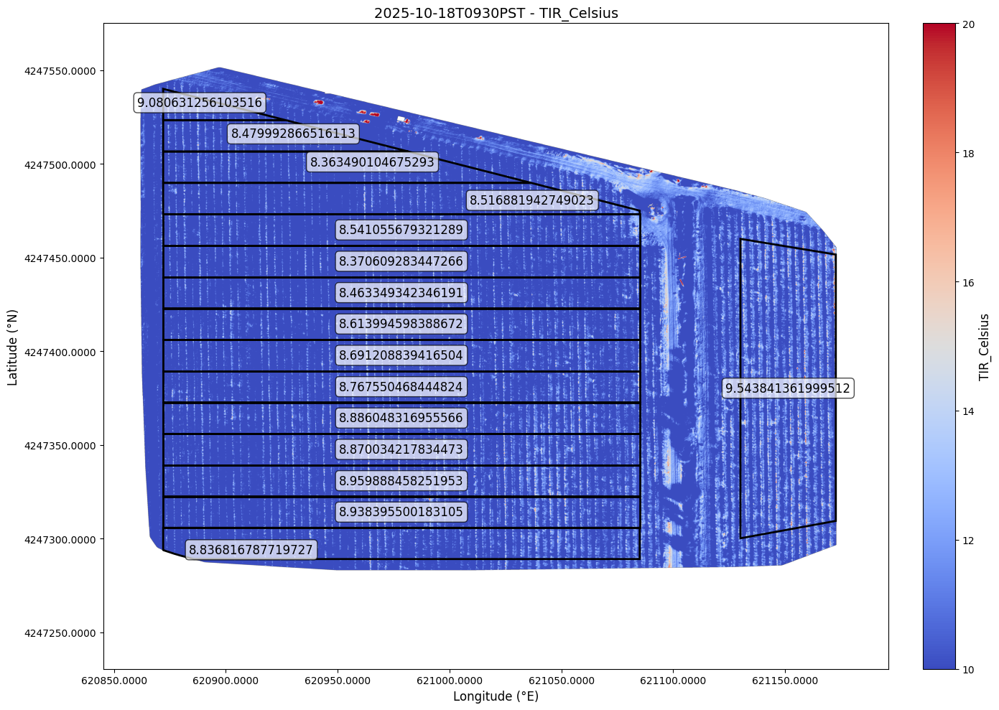

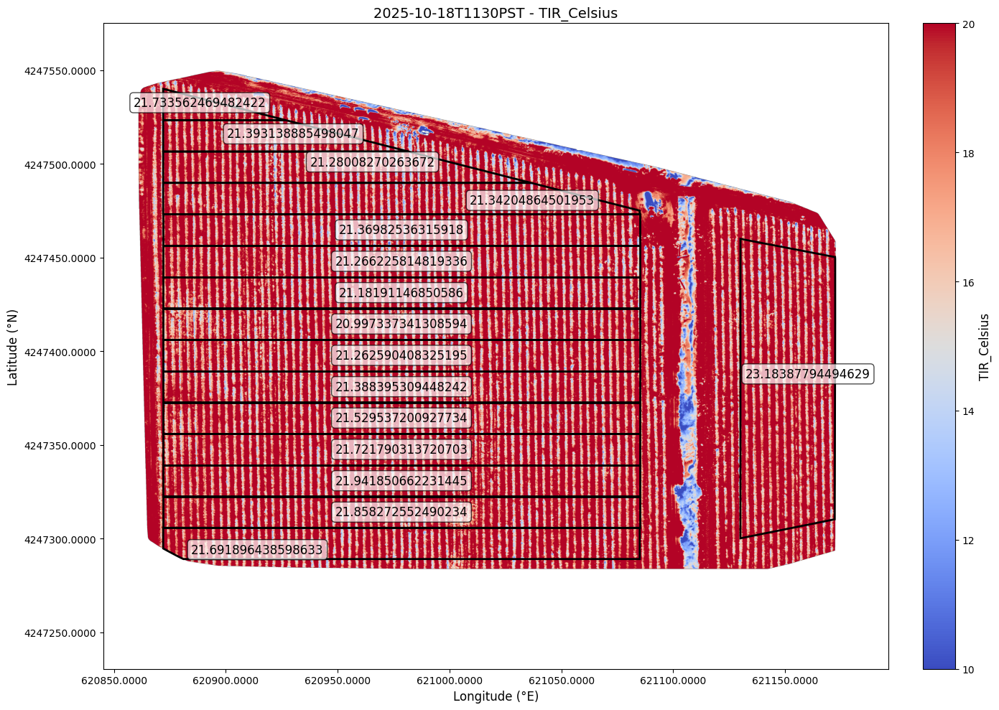

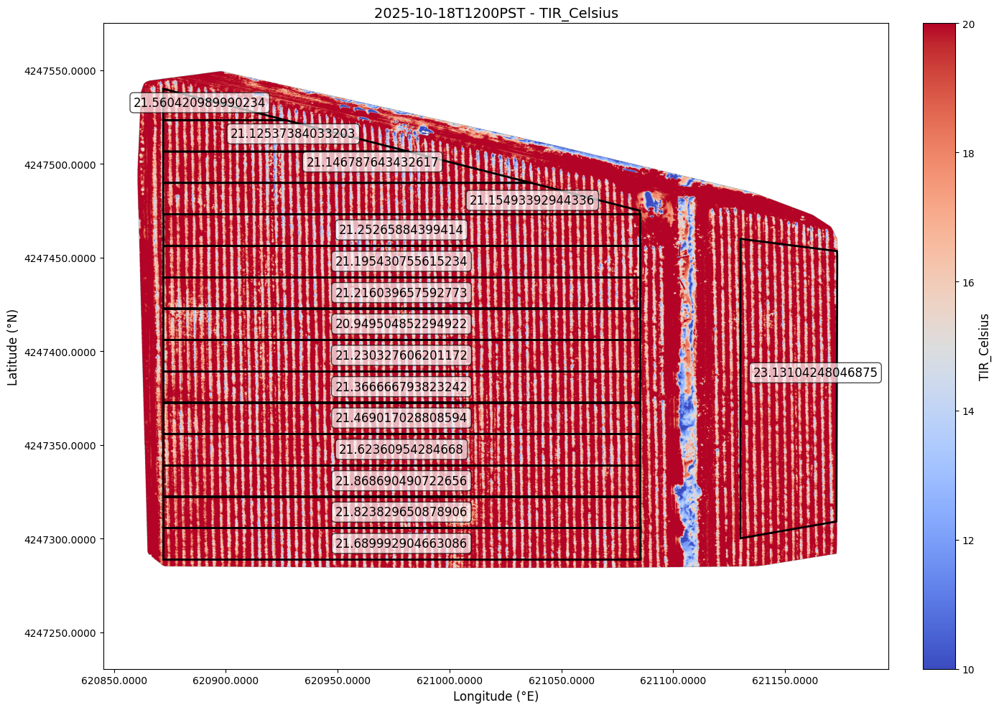

In [8]:
mean_temperatures = defaultdict(dict)

for flight_pass, timestamp in zip(temperature_flight_passes, TEMPERATURE_TIMESTAMPS):
    experimental_temperatures = flight_pass.query_regions(experimental_regions, "TIR_Celsius")
    for i, temp in enumerate(experimental_temperatures):
        mean_temperatures[timestamp][f"Experimental Band {i}"] = temp
    mean_temperatures[timestamp]["Control"] = flight_pass.query_regions([control_region], "TIR_Celsius")[0]


for flight_pass, timestamp in zip(temperature_flight_passes, TEMPERATURE_TIMESTAMPS):
    region_names = []
    for k, v in mean_temperatures[timestamp].items():
        region_names.append(f"{v}")
    figure = flight_pass.visualize(
        [
            *experimental_regions, 
            control_region
        ], 
        region_names, 
        "TIR_Celsius", 
        mean_center=False,
        vmin=10,
        vmax=20
    )
    figure.savefig(PROJECT_ROOT / "plots/tif_temp_plots" / timestamp)

Initialized FlightDifference: 2025-10-18T0930PST -> 2025-10-18T1130PST
Common channels: {'TIR_Celsius'}


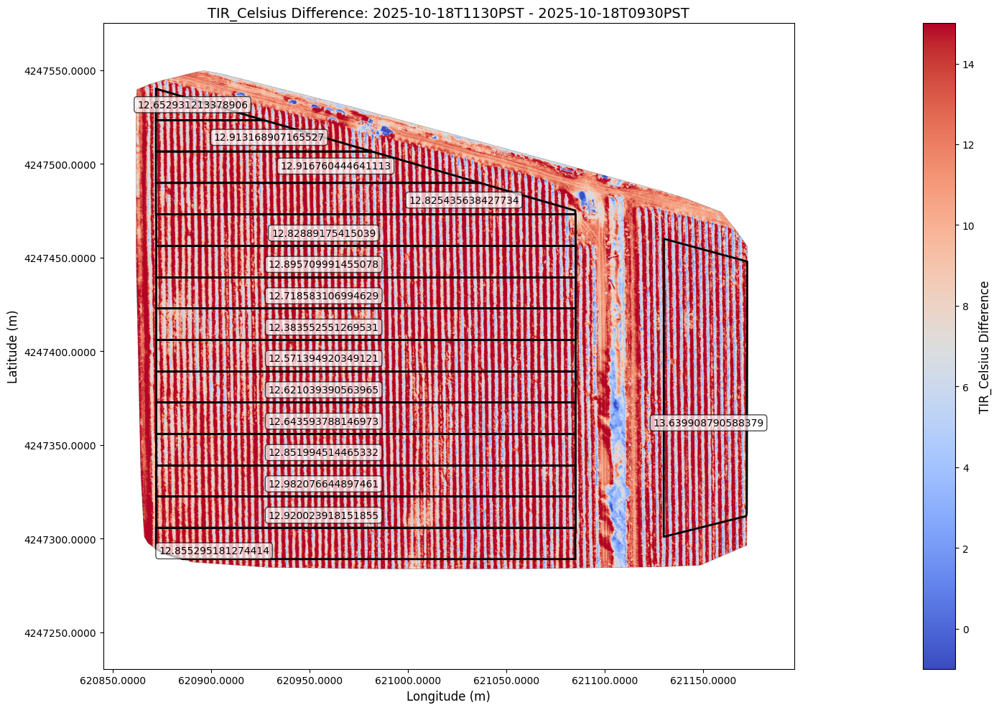

Initialized FlightDifference: 2025-10-18T0930PST -> 2025-10-18T1200PST
Common channels: {'TIR_Celsius'}


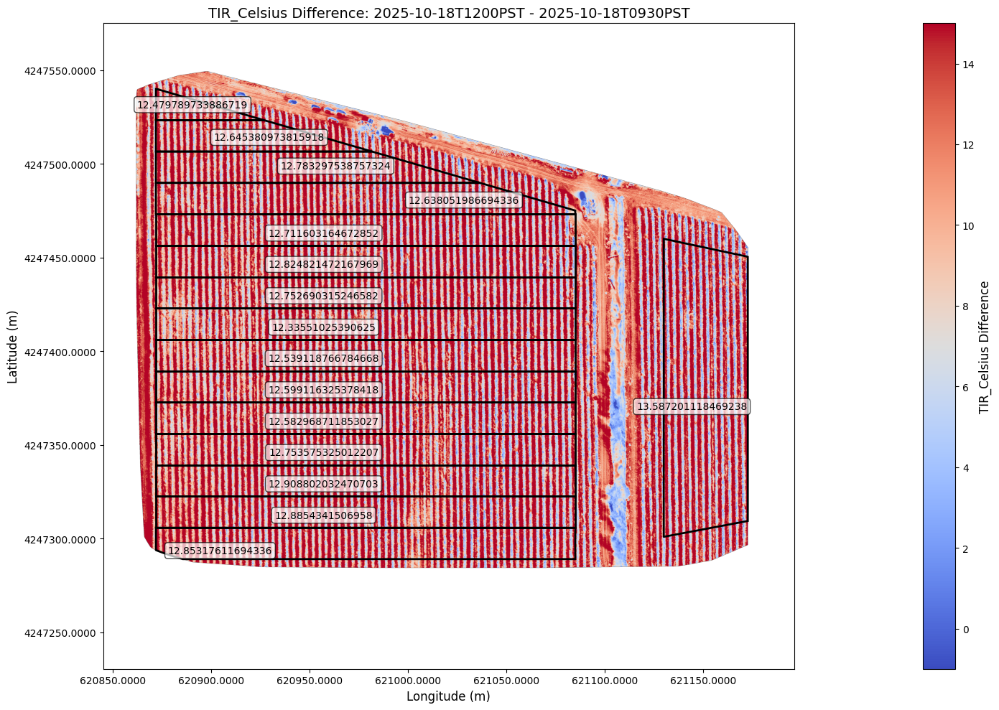

In [9]:
for after_time in ["1130", "1200"]:
    flight_difference = FlightDifference(
        "2025-10-18T0930PST", f"2025-10-18T{after_time}PST", MASTER_REF, DATA_DIR
    )

    mean_temperatures = defaultdict(dict)
    experimental_temperatures = flight_difference.query_regions(experimental_regions, "TIR_Celsius")
    for i, temp in enumerate(experimental_temperatures):
        mean_temperatures["diff_1"][f"Experimental Band {i}"] = temp
    mean_temperatures["diff_1"]["Control"] = flight_difference.query_regions([control_region], "TIR_Celsius")[0]

    region_names = []
    for k, v in mean_temperatures["diff_1"].items():
        region_names.append(f"{v}")

    figure = flight_difference.visualize(
        [
            *experimental_regions, 
            control_region
        ], 
        region_names, 
        "TIR_Celsius", 
        mean_center=False,
        vmin=-1.0,
        vmax=15.0
    )
    figure.savefig(PROJECT_ROOT / "plots/tif_temp_plots" / f"10-18-diff_0930_to_{after_time}")

Do not include RGB based Plume identification and associated cooling in the analysis.
It is not complete yet

In [10]:
# for cutoff in range(170, 200, 10):
#     flight_difference_2 = FlightDifference(
#         "2025-10-18T0930PST", "2025-10-18T1130PST", MASTER_REF, DATA_DIR, verbose=False
#     )
#     upper_region_mask = flight_difference_2.after.create_mask_from_polygon(
#         [
#             (620872, 4247390),
#             (621085, 4247390),
#             (621085, 4247475),
#             (620872, 4247540)
#         ]
#     )
#     bright_region = [upper_region_mask, vegetation_mask]
#     dark_region = [upper_region_mask, vegetation_mask]
#     for i in range(3):
#         bright_region.append(flight_difference_2.after.create_mask_from_feature(f"RGB_band{i}", cutoff, greater_than=True))
#         dark_region.append(flight_difference_2.after.create_mask_from_feature(f"RGB_band{i}", cutoff, greater_than=False))

#     temps = flight_difference_2.query_regions(
#         [bright_region, dark_region, control_region],
#         "TIR_Celsius"
#     )
#     fig = flight_difference_2.visualize(
#         [bright_region, dark_region, control_region],
#         [
#             f"caco3 area: {temps[0]}", 
#             f"clear area: {temps[1]}",
#             f"control area: {temps[2]}"
#         ],
#         "TIR_Celsius",
#         aggregate_frac=0.30,
#         vmin = -1,
#         vmax = 5
#     )
#     fig.savefig(PROJECT_ROOT / "plots" / "tif_temp_plots" / f"10-18-diff_0930_to_1130_rgb_mask_{cutoff}.png")

In [11]:
# def combine_masks(masks):
#     mask = masks[0]
#     for m in masks:
#         mask = mask & m
#     print(mask.sum(), mask.shape)
#     return mask
    
# bright_region = [upper_region_mask, vegetation_mask]
# for i in range(3):
#     bright_region.append(
#         flight_difference_2.after.create_mask_from_feature(
#             f"RGB_band{i}", 100, greater_than=True
#         )
#     )

# mask_vis = flight_difference_2.after.visualize_mask(
#     combine_masks(bright_region), 
#     "TIR_Celsius", 
#     mask_alpha=1.0
# )